# SAM_demo Notebook

## Table of Contents
- [1. Data Loading and Preprocessing](#Data-Loading-and-Preprocessing)
- [2. Simulator Functions](#Simulator-Functions)
- [3. Scoring Calculations](#Scoring-Calculations)
- [4. Visualization](#Visualization)
- [5. Testing and Results Analysis](#Testing-and-Results-Analysis)

<h2 id="data-loading-and-preprocessing">1. Data Loading and Preprocessing</h2>

In [1]:
# Imports
from itertools import combinations

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import os
import sys
sys.path.insert(0, os.path.abspath('..'))
from tools import generate_gaussian_basis_functions, simulate_sensor_output, compute_distance_matrix, \
    spectral_angle_mapper, visualize_distance_matrix, visualize_sensor_output, mean_min_based_dissimilarity_score, \
    group_based_dissimilarity_score, weighted_mean_min_dissimilarity_score, generate_structured_gaussian_basis_functions



Substances spectral data shape: (142, 5)
[4.0, 4.02265, 4.069, 4.11588, 4.1633, 4.21127, 4.25979, 4.30887, 4.35851, 4.40873, 4.45953, 4.51091, 4.56288, 4.61545, 4.66863, 4.72242, 4.77683, 4.83186, 4.88753, 4.94384, 5.00081, 5.05842, 5.1167, 5.17565, 5.23529, 5.2956, 5.35662, 5.41833, 5.48076, 5.54391, 5.60778, 5.67239, 5.73775, 5.80386, 5.87072, 5.93836, 6.00678, 6.07599, 6.14599, 6.21681, 6.28843, 6.36089, 6.43417, 6.5083, 6.58329, 6.65914, 6.73586, 6.81347, 6.89197, 6.97138, 7.0517, 7.13294, 7.21513, 7.29826, 7.38234, 7.4674, 7.55343, 7.64046, 7.72849, 7.81753, 7.9076, 7.99871, 8.09087, 8.18409, 8.27838, 8.37376, 8.47024, 8.56783, 8.66654, 8.7664, 8.8674, 8.96956, 9.07291, 9.17744, 9.28318, 9.39013, 9.49832, 9.60776, 9.71845, 9.83042, 9.94369, 10.05825, 10.17414, 10.29136, 10.40993, 10.52987, 10.65119, 10.77391, 10.89804, 11.0236, 11.15061, 11.27908, 11.40903, 11.54048, 11.67345, 11.80794, 11.94399, 12.0816, 12.2208, 12.3616, 12.50403, 12.64809, 12.79382, 12.94122, 13.09032, 13.24114

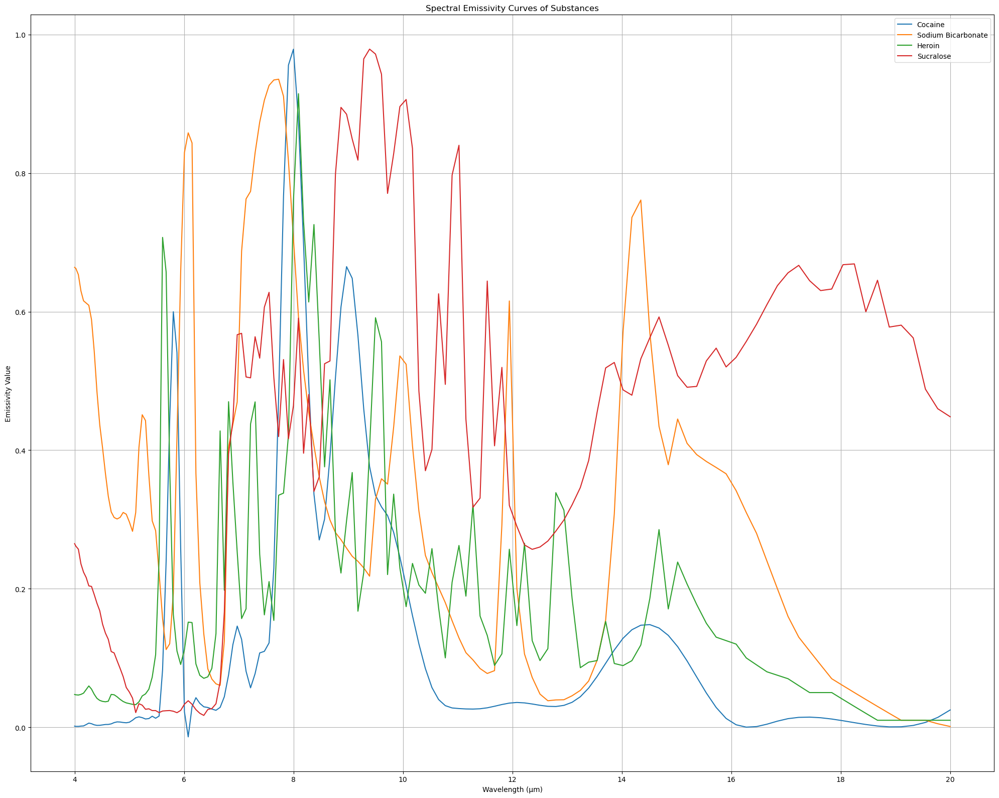

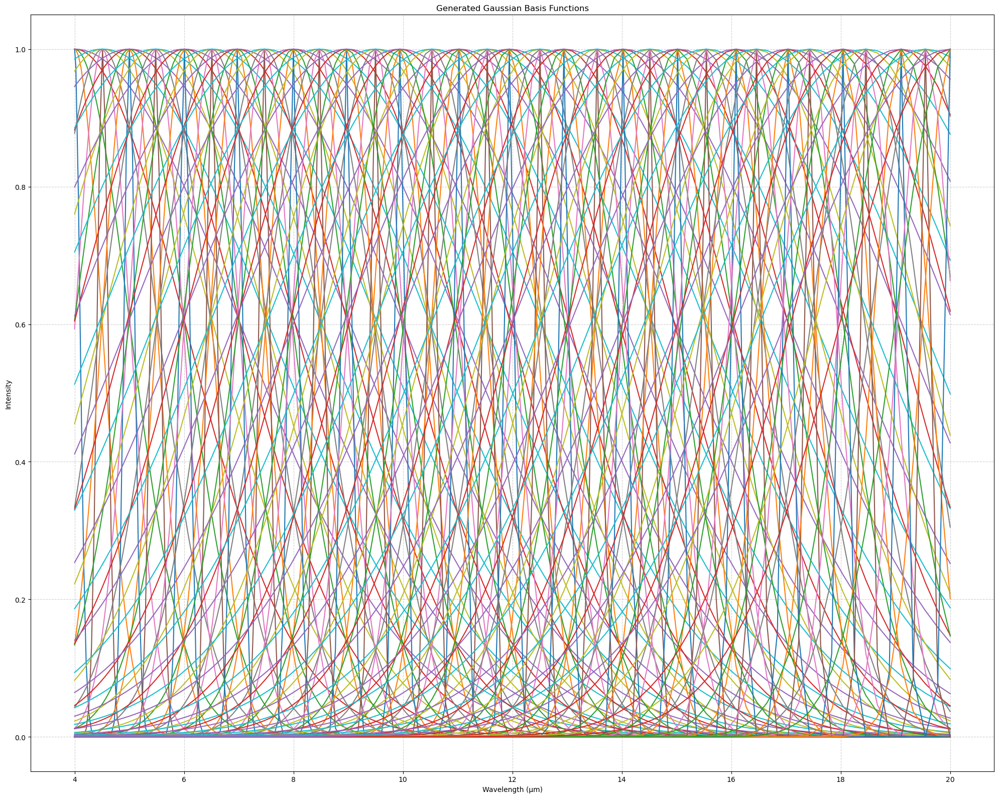

In [26]:
# --------------------------------------------------------------------------------------------------
# File Locations
# --------------------------------------------------------------------------------------------------

# File paths for input data
spectral_data_file = '../data/Test 3 - 4 White Powers/white_powders_modified.xlsx'
air_transmittance_file = '../data/Test 3 - 4 White Powers/Air transmittance.xlsx'
basis_functions_file = '../data/Test 3 - 4 White Powers/Basis functions_4-20um.xlsx'

# --------------------------------------------------------------------------------------------------
# Configurable Parameters
# --------------------------------------------------------------------------------------------------

atmospheric_distance_ratio = 0.11  # Used to model the effect of atmospheric conditions on measurements
temperature_K = 293.15  # Temperature in Kelvin
air_refractive_index = 1  # Refractive index of air

# --------------------------------------------------------------------------------------------------
# Loading Spectral Data & Extracting Features
# --------------------------------------------------------------------------------------------------

# Load the spectral data of substances
substances_spectral_data = pd.read_excel(spectral_data_file)

# Verify the dimensions of the loaded data
print("Substances spectral data shape:", substances_spectral_data.shape)

# Extract the wavelength values (first column)
wavelengths = substances_spectral_data.iloc[:, :1]  # Shape = (d, 1)
print(wavelengths.iloc[:, 0].tolist())

# Extract substance labels (column names excluding the first)
substance_names = substances_spectral_data.columns[1:].to_numpy()

# Extract emissivity curves (all data except the first column)
emissivity_curves = substances_spectral_data.iloc[:, 1:].to_numpy()
print("Emissivity curves shape:", emissivity_curves.shape)

# --------------------------------------------------------------------------------------------------
# Loading Basis Functions
# --------------------------------------------------------------------------------------------------

# Load the original basis functions from file (provided by Data Design Team)
original_basis_functions = np.array(pd.read_excel(basis_functions_file, header=None))
original_basis_functions = original_basis_functions[:, 1:]  # Remove the spectra column

# # Generate 50 Gaussian-based Basis Functions for testing
# num_basis_functions = 50  # Number of basis functions to generate
# random_seed = 323          # Set random seed for reproducibility
# gaussian_basis_functions, means, sigmas = generate_gaussian_basis_functions(
#     wavelengths, 
#     num_basis_functions, 
#     random_seed=random_seed
# )

# Parameters for Structured Gaussian Basis Functions
mean_range = (4, 20)  # Range for the means
step = 0.5
widths = [0.1, 0.5, 1.0, 2.0, 3.0]  # Widths for thin, medium, fat, and fattest

# Generate Gaussian basis functions using the updated function
gaussian_basis_functions, all_means, all_sigmas = generate_structured_gaussian_basis_functions(
    wavelengths=wavelengths,
    mean_range=mean_range,
    step=step,
    widths=widths
)

# Verify outputs
print("Gaussian Basis Functions Shape:", gaussian_basis_functions.shape)  # Should be (len(wavelengths), num_basis_functions)
print("Means:", all_means)  # Shape (num_basis_functions,)
print("Sigmas:", all_sigmas)  # Shape (num_basis_functions,)


# Verify the shapes of the loaded and generated basis functions
print("Original basis functions shape:", original_basis_functions.shape)
print("Generated Gaussian basis functions shape:", gaussian_basis_functions.shape)

# --------------------------------------------------------------------------------------------------
# Loading Additional Parameters
# --------------------------------------------------------------------------------------------------

# Load air transmittance matrix
air_transmittance = np.array(pd.read_excel(air_transmittance_file, header=None))
air_transmittance = air_transmittance[:, 1:]  # Remove the spectra column

# --------------------------------------------------------------------------------------------------
# Visualization: Spectral Emissivity Curves
# --------------------------------------------------------------------------------------------------

# Plot the emissivity curves for all substances
plt.figure(figsize=(20, 16))  
for name in substance_names:
    plt.plot(wavelengths, substances_spectral_data[name], label=name)

# Add plot labels and grid
plt.xlabel('Wavelength (µm)')
plt.ylabel('Emissivity Value')
plt.title('Spectral Emissivity Curves of Substances')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# --------------------------------------------------------------------------------------------------
# Visualization: Gaussian Basis Functions
# --------------------------------------------------------------------------------------------------

# Plot the Gaussian basis functions
plt.figure(figsize=(20, 16))

max_to_plot = 300  # Plot only the first 10 functions for clarity
for i in range(min(max_to_plot, gaussian_basis_functions.shape[1])):
    # Plot each Gaussian basis function with its mean and sigma values
    plt.plot(wavelengths, gaussian_basis_functions[:, i], label=f"µ={all_means[i]:.1f}, σ={all_sigmas[i]:.1f}")

# Customize plot aesthetics
plt.xlabel("Wavelength (µm)")
plt.ylabel("Intensity")
plt.title("Generated Gaussian Basis Functions")
# plt.legend(fontsize=8, loc="upper right")  # Uncomment to add legends for each function
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.show()

Sensor outputs shape: (165, 4)


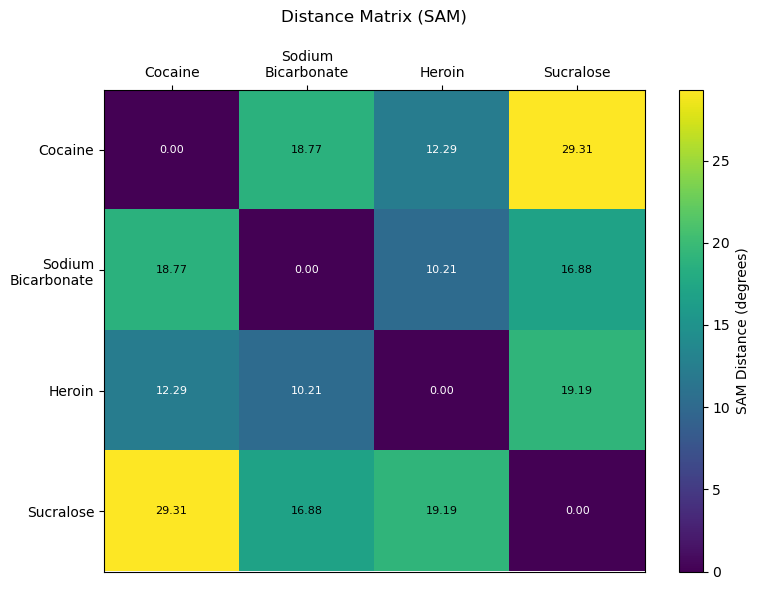

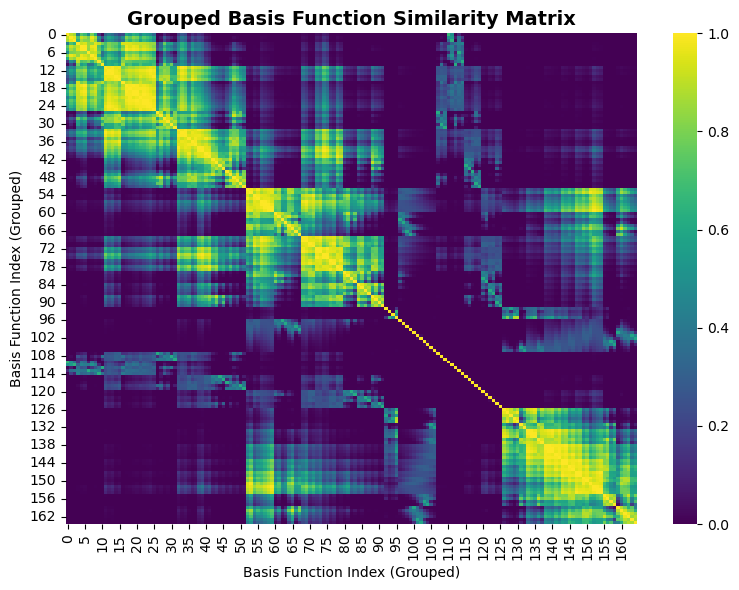

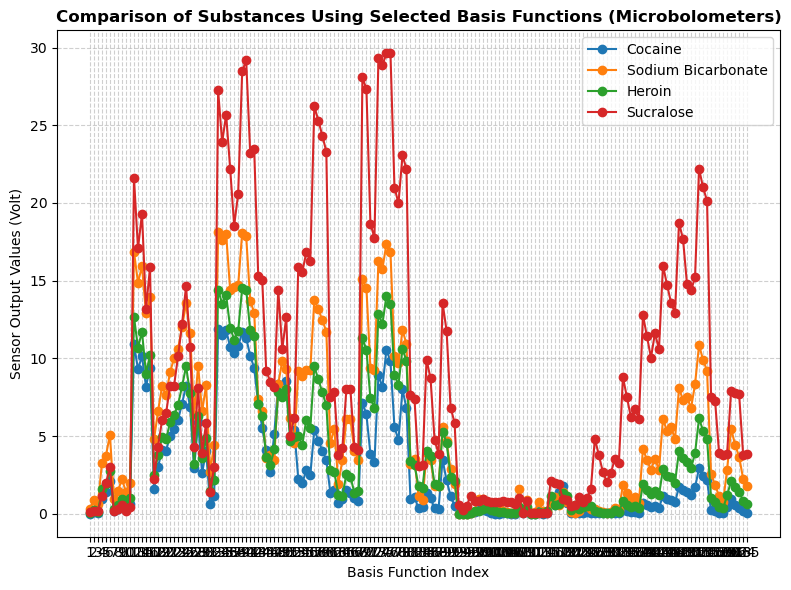

In [3]:
# !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
# This section is some quick test done on a simulated sensor build with all basis function. 
# I don't know if I want to keep it since it might not be much meaningful.
# !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!

# --------------------------------------------------------------------------------------------------
# Generate Sensor Outputs
# --------------------------------------------------------------------------------------------------

# Generate the sensor response matrix using the selected basis functions and emissivity curves
sensor_outputs = simulate_sensor_output(
    wavelengths=wavelengths,  # Wavelength data
    substances_emissivity=emissivity_curves,  # Emissivity curves of substances
    basis_functions=gaussian_basis_functions,  # Selected basis functions
    temperature_K=temperature_K,  # Temperature in Kelvin
    atmospheric_distance_ratio=atmospheric_distance_ratio,  # Atmospheric distance ratio
    air_refractive_index=air_refractive_index,  # Refractive index of air
    air_transmittance=air_transmittance  # Air transmittance matrix
)

# Verify the shape of the sensor outputs
print("Sensor outputs shape:", sensor_outputs.shape)

# --------------------------------------------------------------------------------------------------
# Compute SAM Distance Matrix
# --------------------------------------------------------------------------------------------------

# Compute the Spectral Angle Mapper (SAM) distance matrix
distance_matrix = compute_distance_matrix(sensor_outputs, spectral_angle_mapper)

# Visualize the distance matrix
visualize_distance_matrix(
    distance_matrix,
    labels=substance_names,  # Labels for substances
    title="Distance Matrix (SAM)"  # Title of the plot
)

# --------------------------------------------------------------------------------------------------
# Compute and Visualize Basis Function Similarity Matrix
# --------------------------------------------------------------------------------------------------

from sklearn.metrics.pairwise import cosine_similarity
from scipy.cluster.hierarchy import linkage, leaves_list
import seaborn as sns
import matplotlib.pyplot as plt

# Step 1: Compute the similarity matrix for basis functions
basis_function_similarity = cosine_similarity(gaussian_basis_functions.T)  # Transpose for pairwise similarity

# Step 2: Perform hierarchical clustering and reorder the similarity matrix
linkage_matrix = linkage(basis_function_similarity, method='average')  # Hierarchical clustering
sorted_indices = leaves_list(linkage_matrix)  # Extract reordered indices
sorted_similarity_matrix = basis_function_similarity[sorted_indices, :][:, sorted_indices]  # Reorder the similarity matrix

# Step 3: Visualize the grouped similarity matrix
plt.figure(figsize=(8, 6))
sns.heatmap(sorted_similarity_matrix, cmap="viridis", cbar=True)
plt.title("Grouped Basis Function Similarity Matrix", fontsize=14, fontweight="bold")
plt.xlabel("Basis Function Index (Grouped)")
plt.ylabel("Basis Function Index (Grouped)")
plt.tight_layout()
plt.show()

# --------------------------------------------------------------------------------------------------
# Visualization: Sensor Output
# --------------------------------------------------------------------------------------------------

# Reorder the sensor outputs based on the sorted indices from clustering
sensor_outputs_sorted = sensor_outputs[sorted_indices, :]  # Reorder rows (basis functions)

# Visualize the reordered sensor outputs
visualize_sensor_output(
    sensor_outputs_sorted,
    substances_names=substance_names,  # Labels for substances
    # Optionally update basis function labels if needed
    # basis_funcs_labels=[f"{i+1}" for i in sorted_indices]  # Updated labels (optional)
)

In [4]:
# --------------------------------------------------------------------------------------------------
# Compute Mean-Min Based Dissimilarity Score
# --------------------------------------------------------------------------------------------------

# Compute the mean-min based dissimilarity score with a specified alpha
mean_min_score = mean_min_based_dissimilarity_score(distance_matrix, alpha=3)

# Display the computed score
print("Mean-Min Based Dissimilarity Score:", mean_min_score)

# --------------------------------------------------------------------------------------------------
# Compute Group-Based Dissimilarity Score
# --------------------------------------------------------------------------------------------------

# Define the groups for dissimilarity evaluation
groups = [
    [0, 2],  # Group 1: Cocaine, Heroin
    [1, 3]   # Group 2: Sodium Bicarbonate, Sucralose
]

# Compute the group-based dissimilarity score
group_based_score = group_based_dissimilarity_score(distance_matrix, groups)

# Display the computed score
print("Group-Based Dissimilarity Score:", group_based_score)

Mean-Min Based Dissimilarity Score: 18892.083384496163
Group-Based Dissimilarity Score: 19.36913796588023


In [5]:
# # --------------------------------------------------------------------------------------------------
# # Configuration: Number of Basis Functions to Select
# # --------------------------------------------------------------------------------------------------

# # Define the number of basis functions to select for evaluation
# num_basis_funcs = 4

# # Generate all possible combinations of the specified number of basis functions
# basis_func_combinations = list(combinations(range(gaussian_basis_functions.shape[1]), num_basis_funcs))

# # --------------------------------------------------------------------------------------------------
# # Compute Scores for Each Subset of Basis Functions
# # --------------------------------------------------------------------------------------------------

# # Initialize a list to store results
# results = []

# # Iterate through each combination of basis functions
# for subset in basis_func_combinations:
#     # Select the current subset of basis functions
#     selected_basis_funcs = gaussian_basis_functions[:, subset]

#     # Generate sensor outputs for the selected basis functions
#     sensor_outputs = simulate_sensor_output(
#         wavelengths=wavelengths,
#         substances_emissivity=emissivity_curves,
#         basis_functions=selected_basis_funcs,
#         temperature_K=temperature_K,
#         atmospheric_distance_ratio=atmospheric_distance_ratio,
#         air_refractive_index=air_refractive_index,
#         air_transmittance=air_transmittance
#     )

#     # Compute the distance matrix using the SAM metric
#     distance_matrix = compute_distance_matrix(sensor_outputs, spectral_angle_mapper)

#     # Compute scores for the current subset
#     score_mean_min = mean_min_based_dissimilarity_score(distance_matrix, alpha=3)
#     score_group_based = group_based_dissimilarity_score(distance_matrix, groups)

#     # Store the subset and scores in the results
#     results.append({
#         "subset": subset,
#         "mean_min_score": score_mean_min,
#         "group_based_score": score_group_based
#     })

# # --------------------------------------------------------------------------------------------------
# # Analyze and Display the Best Results
# # --------------------------------------------------------------------------------------------------

# # Convert the results into a DataFrame for easier analysis
# results_df = pd.DataFrame(results)

# # Identify the best subset for mean-min score
# best_result_mean_min = results_df.sort_values(by="mean_min_score", ascending=False).iloc[0]
# print("Best Subset (Mean-Min Score):", best_result_mean_min["subset"])
# print("Best Mean-Min Score:", best_result_mean_min["mean_min_score"])

# # Identify the best subset for group-based score
# best_result_group_based = results_df.sort_values(by="group_based_score", ascending=False).iloc[0]
# print("Best Subset (Group-Based Score):", best_result_group_based["subset"])
# print("Best Group-Based Score:", best_result_group_based["group_based_score"])

In [6]:
import functools
from concurrent.futures import ProcessPoolExecutor
from tqdm.notebook import tqdm
from multiprocessing_helpers import process_subset

# --------------------------------------------------------------------------------------------------
# Configuration: Number of Basis Functions to Select
# --------------------------------------------------------------------------------------------------

# Define the number of basis functions to select for evaluation
num_basis_funcs = 4

# Generate all possible combinations of the specified number of basis functions
basis_func_combinations = list(combinations(range(gaussian_basis_functions.shape[1]), num_basis_funcs))
print(f"Total combinations: {len(basis_func_combinations)}")

# --------------------------------------------------------------------------------------------------
# Parallel Processing: Compute Scores for Each Subset of Basis Functions
# --------------------------------------------------------------------------------------------------

# Prepare a partial function to bind additional arguments for the processing function
process_subset_partial = functools.partial(
    process_subset,
    gaussian_basis_functions=gaussian_basis_functions,
    wavelengths=wavelengths,
    emissivity_curves=emissivity_curves,
    temperature_K=temperature_K,
    atmospheric_distance_ratio=atmospheric_distance_ratio,
    air_refractive_index=air_refractive_index,
    air_transmittance=air_transmittance,
    spectral_angle_mapper=spectral_angle_mapper,
    groups=groups
)

# Use a process pool for parallel processing of basis function combinations
results = []
with ProcessPoolExecutor() as executor:
    # Submit tasks in parallel using the partial function and display progress using tqdm
    futures = list(tqdm(
        executor.map(process_subset_partial, basis_func_combinations, chunksize=100),
        total=len(basis_func_combinations),
        desc="Processing Combinations"
    ))

    # Collect results from completed tasks
    results = [res for res in futures if res is not None]

# --------------------------------------------------------------------------------------------------
# Analyze and Display the Best Results
# --------------------------------------------------------------------------------------------------

# Convert the results into a DataFrame for easier analysis and sorting
results_df = pd.DataFrame(results)

# Identify the best subset based on the mean-min score
best_result_mean_min = results_df.sort_values(by="mean_min_score", ascending=False).iloc[0]
print("Best Subset (Mean-Min Score):", best_result_mean_min["subset"])
print("Best Mean-Min Score:", best_result_mean_min["mean_min_score"])

# Identify the best subset based on the group-based score
best_result_group_based = results_df.sort_values(by="group_based_score", ascending=False).iloc[0]
print("Best Subset (Group-Based Score):", best_result_group_based["subset"])
print("Best Group-Based Score:", best_result_group_based["group_based_score"])

# Identify the best subset based on the weighted mean-min score
best_result_weighted_mean_min = results_df.sort_values(by="weighted_mean_min_score", ascending=False).iloc[0]
print("Best Subset (Weighted Mean-Min Score):", best_result_weighted_mean_min["subset"])
print("Best Weighted Mean-Min Score:", best_result_weighted_mean_min["weighted_mean_min_score"])

# Identify the best subset based on the FOM score
best_result_fom = results_df.sort_values(by="fom_score", ascending=True).iloc[0]
print("Best Subset (FOM Score):", best_result_fom["subset"])
print("Best FOM Score:", best_result_fom["fom_score"])


Total combinations: 29772765


Processing Combinations:   0%|          | 0/29772765 [00:00<?, ?it/s]

Best Subset (Mean-Min Score): (90, 95, 120, 151)
Best Mean-Min Score: 6232754.004961328
Best Subset (Group-Based Score): (1, 5, 25, 150)
Best Group-Based Score: 71.96578710986319
Best Subset (Weighted Mean-Min Score): (6, 90, 95, 151)
Best Weighted Mean-Min Score: 53.74023622134262
Best Subset (FOM Score): (32, 51, 82, 133)
Best FOM Score: 0.5762295614853943


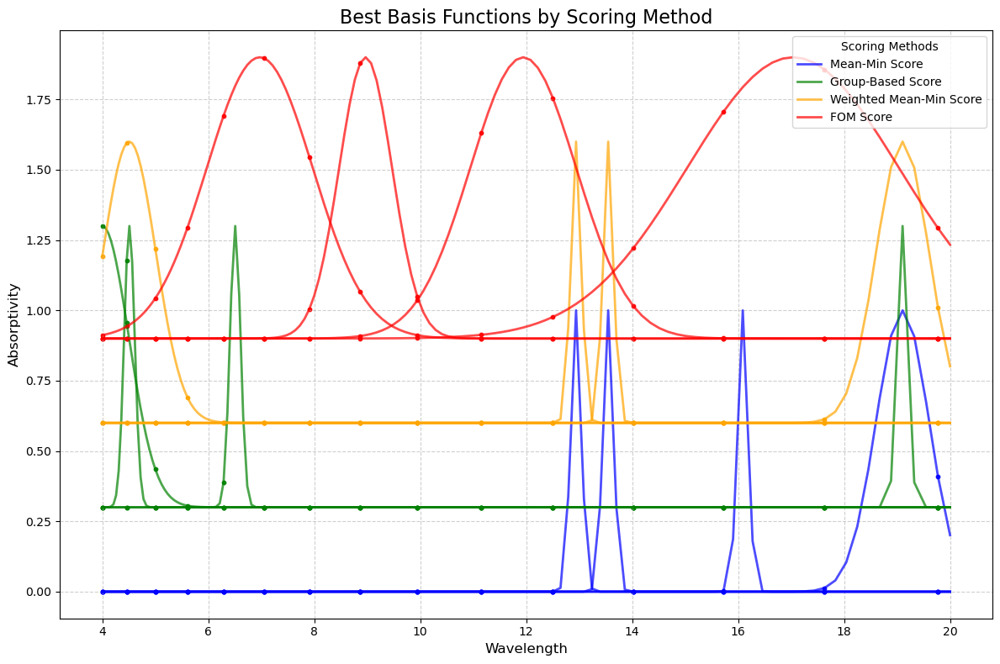

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Colors for each score
score_colors = {
    "Mean-Min Score": "blue",
    "Group-Based Score": "green",
    "Weighted Mean-Min Score": "orange",
    "FOM Score": "red"
}

# Ensure FOM score uses ascending order for the best result
# best_result_fom = results_df.sort_values(by="fom_score", ascending=True).iloc[0]

# Retrieve the best subset of indices for each score
best_indices = {
    "Mean-Min Score": list(best_result_mean_min["subset"]),
    "Group-Based Score": list(best_result_group_based["subset"]),
    "Weighted Mean-Min Score": list(best_result_weighted_mean_min["subset"]),
    "FOM Score": list(best_result_fom["subset"])  # Corrected for ascending order
}

# Create a figure for the plot
plt.figure(figsize=(12, 8))

# Plot the best basis functions for each score
for score_offset, (score_name, color) in enumerate(score_colors.items()):
    indices = best_indices[score_name]  # Get indices of the best subset for this score
    basis_funcs = gaussian_basis_functions[:, indices]  # Retrieve the basis functions

    # Apply a larger vertical offset for this score
    vertical_offset = score_offset * 0.3  # Larger offset to fully separate groups

    for i, basis_func in enumerate(basis_funcs.T):  # Transpose for iteration over columns
        plt.plot(
            wavelengths,
            basis_func + vertical_offset,
            color=color,
            alpha=0.7,  # Make curves slightly transparent
            label=f"{score_name}" if i == 0 else None,
            linewidth=2
        )

        # Add markers for clarity
        plt.scatter(
            wavelengths[::10],  # Plot markers every 10 data points for readability
            basis_func[::10] + vertical_offset,
            color=color,
            alpha=0.9,
            s=10  # Marker size
        )

# Customize the plot
plt.title("Best Basis Functions by Scoring Method", fontsize=16)
plt.xlabel("Wavelength", fontsize=12)
plt.ylabel("Absorptivity", fontsize=12)
plt.legend(title="Scoring Methods", loc="upper right", fontsize=10)
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()

# Show the plot
plt.show()

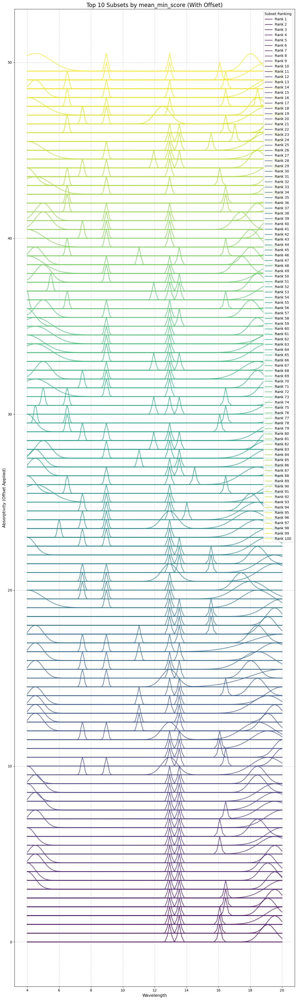

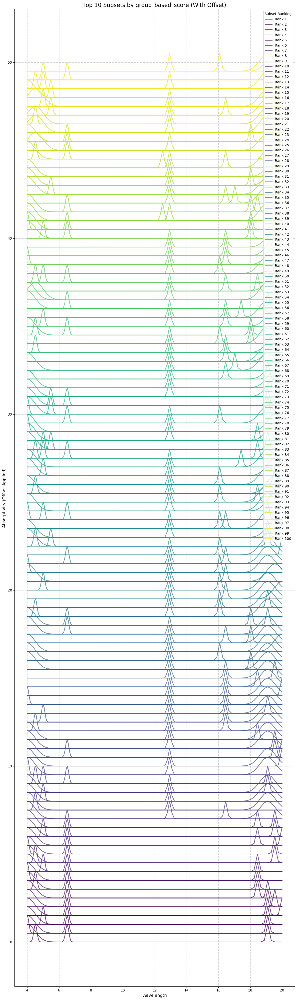

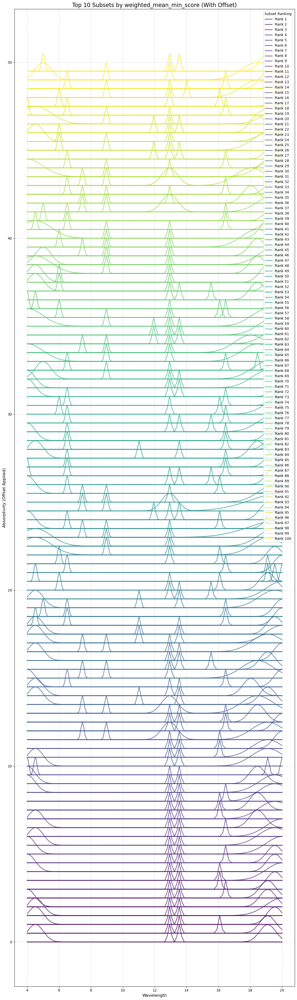

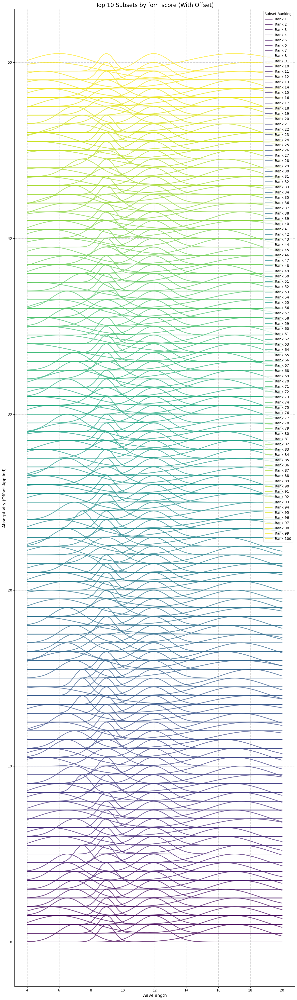

In [22]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.cm as cm  # For color maps

def plot_top_10_basis_functions_with_offset(score_name, results_df, gaussian_basis_functions, wavelengths, vertical_offset=0.2, ascending=True):
    """
    Plots the top 10 subsets of basis functions for a specific score with vertical offset.

    Parameters:
    - score_name (str): The column name of the score in the DataFrame.
    - results_df (DataFrame): The DataFrame containing the subsets and their scores.
    - gaussian_basis_functions (ndarray): Array of generated basis functions.
    - wavelengths (ndarray): The array of wavelengths.
    - vertical_offset (float): The vertical offset between subsets.
    - ascending (bool): Whether to sort the scores in ascending order (for FOM) or descending order.
    """
    # Sort the results by the given score and extract the top 10 subsets
    top_10_results = results_df.sort_values(by=score_name, ascending=ascending).head(100)
    top_10_subsets = top_10_results["subset"]
    
    # Generate a colormap for the top 10 subsets
    colors = cm.viridis(np.linspace(0, 1, 100))  # Use a colormap with 10 distinct colors

    # Create a figure
    plt.figure(figsize=(12, 40))
    
    for rank, (subset, color) in enumerate(zip(top_10_subsets, colors)):
        indices = list(subset)  # Extract the basis function indices for this subset
        basis_funcs = gaussian_basis_functions[:, indices]  # Retrieve the basis functions

        # Plot each basis function in the subset with vertical offset
        for i, basis_func in enumerate(basis_funcs.T):  # Transpose for iteration over columns
            plt.plot(
                wavelengths,
                basis_func + rank * vertical_offset,  # Apply vertical offset
                color=color,
                alpha=0.7,
                label=f"Rank {rank + 1}" if i == 0 else None,  # Only label once per subset
                linewidth=2
            )

    # Customize the plot
    plt.title(f"Top 10 Subsets by {score_name} (With Offset)", fontsize=16)
    plt.xlabel("Wavelength", fontsize=12)
    plt.ylabel("Absorptivity (Offset Applied)", fontsize=12)
    plt.legend(title="Subset Ranking", loc="upper right", fontsize=10)
    plt.grid(True, linestyle="--", alpha=0.6)
    plt.tight_layout()
    
    # Show the plot
    plt.show()

# Plot the top 10 subsets for each score with vertical offset
plot_top_10_basis_functions_with_offset("mean_min_score", results_df, gaussian_basis_functions, wavelengths, vertical_offset=0.5, ascending=False)
plot_top_10_basis_functions_with_offset("group_based_score", results_df, gaussian_basis_functions, wavelengths, vertical_offset=0.5, ascending=False)
plot_top_10_basis_functions_with_offset("weighted_mean_min_score", results_df, gaussian_basis_functions, wavelengths, vertical_offset=0.5, ascending=False)
plot_top_10_basis_functions_with_offset("fom_score", results_df, gaussian_basis_functions, wavelengths, vertical_offset=0.5, ascending=True)

Distance Matrix:
[[0.         1.         1.96749308 1.58462268 1.12295549 0.51091
  1.12295549 2.14746843 1.80322507 1.41478643]
 [1.         0.         2.94466111 2.55167181 2.06422601 1.12295549
  0.51091    3.06783648 2.69288334 2.23643034]
 [1.96749308 2.94466111 0.         0.4        0.9        1.9
  2.9        0.4899     0.63245712 1.02469606]
 [1.58462268 2.55167181 0.4        0.         0.5        1.5
  2.5        0.63245712 0.4899     0.70000144]
 [1.12295549 2.06422601 0.9        0.5        0.         1.
  2.         1.02469606 0.70000144 0.4899    ]
 [0.51091    1.12295549 1.9        1.5        1.         0.
  1.         1.9621422  1.57797402 1.11355378]
 [1.12295549 0.51091    2.9        2.5        2.         1.
  0.         2.94108858 2.54754824 2.05912652]
 [2.14746843 3.06783648 0.4899     0.63245712 1.02469606 1.9621422
  2.94108858 0.         0.4        0.9       ]
 [1.80322507 2.69288334 0.63245712 0.4899     0.70000144 1.57797402
  2.54754824 0.4        0.         0.

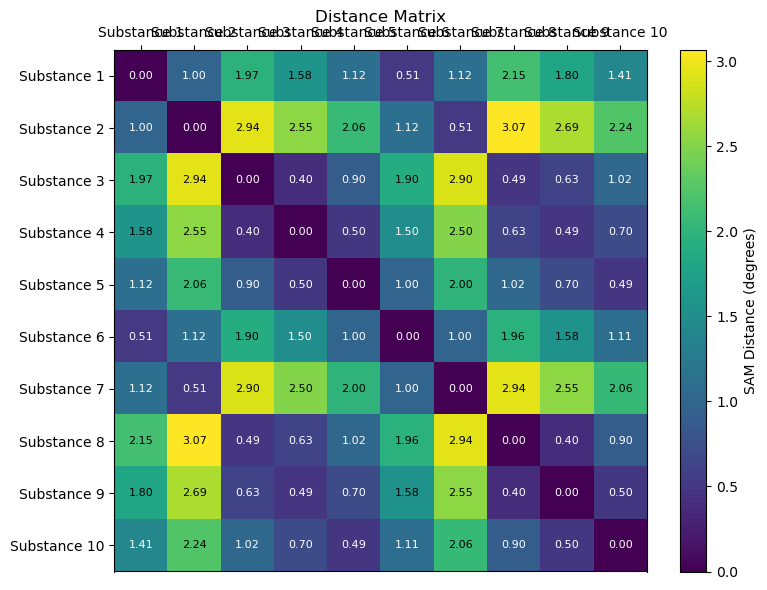

In [31]:
import numpy as np
from scipy.optimize import linear_sum_assignment

# Function to compute the optimal distance between two sets
def compute_optimal_set_distance(means, sigmas, set_1_indices, set_2_indices):
    """
    Compute the distance between two sets of basis functions using optimal pairing.

    Parameters:
    - means (ndarray): Means of all basis functions.
    - sigmas (ndarray): Sigmas of all basis functions.
    - set_1_indices (list): Indices of basis functions in set 1.
    - set_2_indices (list): Indices of basis functions in set 2.

    Returns:
    - optimal_distance (float): Total optimal distance between the two sets.
    """
    set_1 = np.array([[means[i], sigmas[i]] for i in set_1_indices])
    set_2 = np.array([[means[j], sigmas[j]] for j in set_2_indices])
    pairwise_distances = np.zeros((len(set_1), len(set_2)))
    for i, b1 in enumerate(set_1):
        for j, b2 in enumerate(set_2):
            pairwise_distances[i, j] = np.sqrt((b1[0] - b2[0])**2 + (b1[1] - b2[1])**2)
    row_indices, col_indices = linear_sum_assignment(pairwise_distances)
    return pairwise_distances[row_indices, col_indices].sum()

# Assuming `results_df` is already processed and sorted
# Example: Top 10 subsets based on "mean_min_score"
top_10_results = results_df.head(10)  # First 10 rows of the DataFrame
top_10_subsets = top_10_results["subset"].tolist()  # Extract subsets (list of lists)

# Initialize the distance matrix
num_subsets = len(top_10_subsets)
distance_matrix = np.zeros((num_subsets, num_subsets))

# Compute pairwise distances between all subsets
for i in range(num_subsets):
    for j in range(i, num_subsets):  # Only compute upper triangular (matrix is symmetric)
        if i == j:
            distance_matrix[i, j] = 0  # Distance to itself is 0
        else:
            distance_matrix[i, j] = compute_optimal_set_distance(
                all_means, all_sigmas, top_10_subsets[i], top_10_subsets[j]
            )
            distance_matrix[j, i] = distance_matrix[i, j]  # Symmetric matrix

print("Distance Matrix:")
print(distance_matrix)

# Perform iVAT (if an iVAT implementation is available)
# Replace this with your iVAT visualization function
# Example: from pyclustertend import ivat
# ivat(distance_matrix)
visualize_distance_matrix(distance_matrix)

In [33]:
import matplotlib.pyplot as plt
from pyclustertend import vat, ivat

# Perform iVAT
ivat_result = ivat(distance_matrix)

# Visualize iVAT
plt.figure(figsize=(8, 8))
plt.title("iVAT Visualization of Top 10 Subsets")
plt.imshow(ivat_result, cmap="viridis", aspect="auto")
plt.colorbar(label="Reordered Distances")
plt.xlabel("Subsets")
plt.ylabel("Subsets")
plt.show()

ModuleNotFoundError: No module named 'pyclustertend'

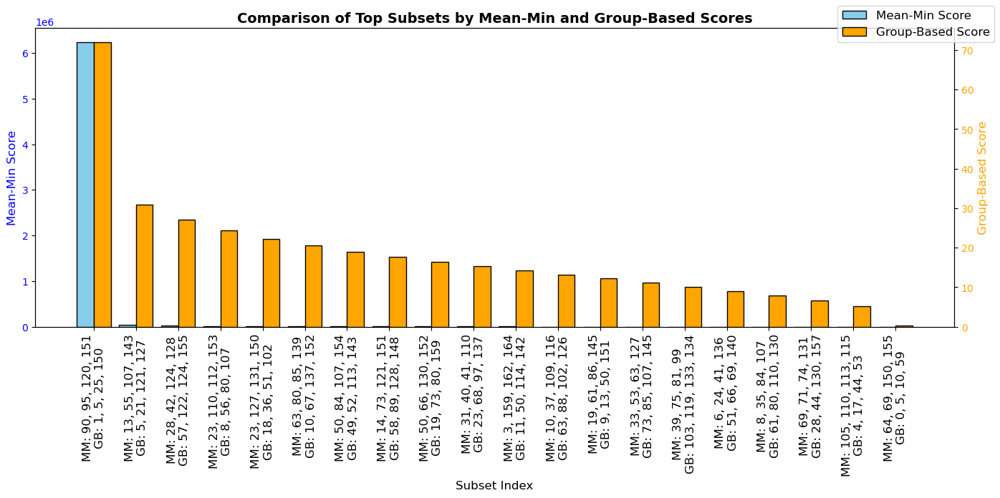

In [10]:
# --------------------------------------------------------------------------------------------------
# Sort and Sample Results
# --------------------------------------------------------------------------------------------------

# Sort the results separately by mean-min score and group-based score
results_df_sorted_mean_min = results_df.sort_values(by="mean_min_score", ascending=False)
results_df_sorted_group_based = results_df.sort_values(by="group_based_score", ascending=False)

# Dynamically sample 20 rows from each sorted DataFrame
num_samples = 20
indices_mean_min = np.linspace(0, len(results_df_sorted_mean_min) - 1, num_samples, dtype=int)
indices_group_based = np.linspace(0, len(results_df_sorted_group_based) - 1, num_samples, dtype=int)

# Extract the sampled DataFrames
results_sampled_mean_min = results_df_sorted_mean_min.iloc[indices_mean_min]
results_sampled_group_based = results_df_sorted_group_based.iloc[indices_group_based]

# --------------------------------------------------------------------------------------------------
# Visualization: Side-by-Side Bar Plot with Two Y-Axes
# --------------------------------------------------------------------------------------------------

# Extract scores for plotting
mean_min_scores = results_sampled_mean_min["mean_min_score"]
group_based_scores = results_sampled_group_based["group_based_score"]

# Generate labels for the subsets
mean_min_labels = results_sampled_mean_min["subset"].apply(lambda x: ", ".join(map(str, x))).tolist()
group_based_labels = results_sampled_group_based["subset"].apply(lambda x: ", ".join(map(str, x))).tolist()

# Create positions for the bars
x = np.arange(num_samples)  # Positions for the bars
bar_width = 0.4  # Width of each bar

# Create a figure and axis
fig, ax1 = plt.subplots(figsize=(14, 7))

# Plot mean-min scores on the left y-axis
bars_mean_min = ax1.bar(
    x - bar_width / 2,
    mean_min_scores,
    width=bar_width,
    label="Mean-Min Score",
    color="skyblue",
    edgecolor="black"
)
ax1.set_ylabel("Mean-Min Score", fontsize=12, color="blue")
ax1.tick_params(axis='y', labelcolor="blue")
ax1.set_xlabel("Subset Index", fontsize=12)

# Create a secondary y-axis for group-based scores
ax2 = ax1.twinx()
bars_group_based = ax2.bar(
    x + bar_width / 2,
    group_based_scores,
    width=bar_width,
    label="Group-Based Score",
    color="orange",
    edgecolor="black"
)
ax2.set_ylabel("Group-Based Score", fontsize=12, color="orange")
ax2.tick_params(axis='y', labelcolor="orange")

# Add labels to each bar (beneath the x-ticks)
ax1.set_xticks(x)
ax1.set_xticklabels(
    [f"MM: {m}\nGB: {g}" for m, g in zip(mean_min_labels, group_based_labels)],
    rotation=90,
    fontsize=12,
    ha="center"
)

# Add a title and grid
plt.title("Comparison of Top Subsets by Mean-Min and Group-Based Scores", fontsize=14, fontweight="bold")

# Add legends
fig.legend(loc="upper right", fontsize=12)
plt.tight_layout()

# Display the plot
plt.show()

In [11]:
# import matplotlib.pyplot as plt

# # --------------------------------------------------------------------------------------------------
# # Plot Multiple Figures for the First Six Best Subsets
# # --------------------------------------------------------------------------------------------------

# # Sort the results by mean-min score in descending order
# top_results = results_df.sort_values(by="mean_min_score", ascending=False).head(6)

# # Loop through the first 6 best subsets
# for idx, row in top_results.iterrows():
#     # Extract the indices of the current subset
#     best_subset_indices = list(row["subset"])
#     print(f"Subset {idx + 1} Indices:", best_subset_indices)  # Print subset indices

#     # Retrieve the best basis functions for the current subset
#     best_basis_funcs = gaussian_basis_functions[:, best_subset_indices]

#     # --------------------------------------------------------------------------------------------------
#     # Plot the Basis Functions for the Current Subset
#     # --------------------------------------------------------------------------------------------------
#     plt.figure(figsize=(8, 6))
#     for index, basis_func in zip(best_subset_indices, best_basis_funcs.T):  # Match basis functions with their indices
#         plt.plot(wavelengths, basis_func, label=f"Basis Function {index}", linewidth=2)

#     # Customize the plot
#     plt.title(f"Best Basis Functions - Subset {idx + 1}", fontsize=16)
#     plt.xlabel("Wavelength", fontsize=12)
#     plt.ylabel("Absorptivity", fontsize=12)
#     plt.legend(title="Indices", loc="upper right", fontsize=10)
#     plt.grid(True, linestyle="--", alpha=0.6)
#     plt.tight_layout()

#     # Show the plot for the current subset
#     plt.show()

In [12]:
# import matplotlib.pyplot as plt

# # --------------------------------------------------------------------------------------------------
# # Plot Multiple Figures for the First Six Best Subsets (Group-Based Score)
# # --------------------------------------------------------------------------------------------------

# # Sort the results by group-based score in descending order
# top_results_group_based = results_df.sort_values(by="group_based_score", ascending=False).head(6)

# # Loop through the first six best subsets
# for idx, row in top_results_group_based.iterrows():
#     # Extract the indices of the current subset
#     best_subset_indices = list(row["subset"])
#     print(f"Subset {idx + 1} Indices (Group-Based Score):", best_subset_indices)  # Print subset indices

#     # Retrieve the best basis functions for the current subset
#     best_basis_funcs = gaussian_basis_functions[:, best_subset_indices]

#     # --------------------------------------------------------------------------------------------------
#     # Plot the Basis Functions for the Current Subset
#     # --------------------------------------------------------------------------------------------------
#     plt.figure(figsize=(8, 6))
#     for index, basis_func in zip(best_subset_indices, best_basis_funcs.T):  # Match basis functions with their indices
#         plt.plot(wavelengths, basis_func, label=f"Basis Function {index}", linewidth=2)

#     # Customize the plot
#     plt.title(f"Best Basis Functions - Subset {idx + 1} (Group-Based Score)", fontsize=16)
#     plt.xlabel("Wavelength", fontsize=12)
#     plt.ylabel("Absorptivity", fontsize=12)
#     plt.legend(title="Indices", loc="upper right", fontsize=10)
#     plt.grid(True, linestyle="--", alpha=0.6)
#     plt.tight_layout()

#     # Show the plot for the current subset
#     plt.show()

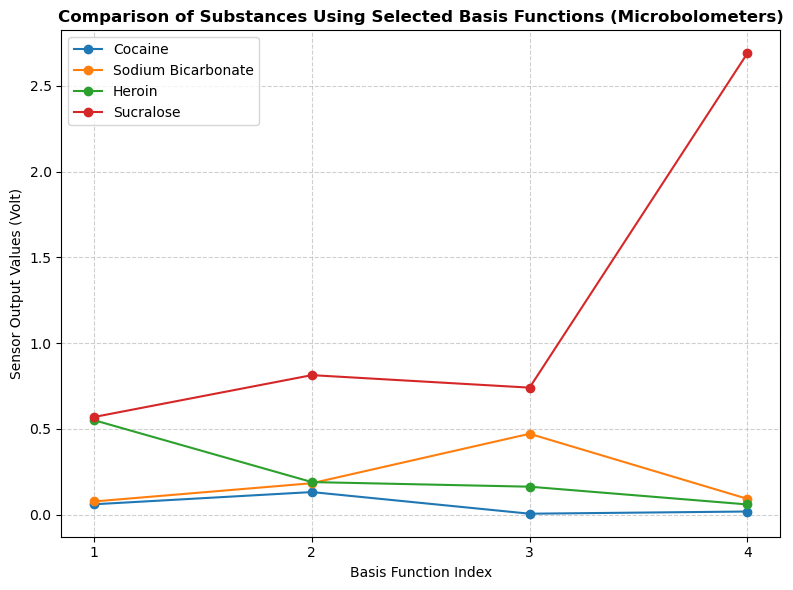

In [13]:
# Retrieve the indices of the best subset
best_subset_indices = list(best_result_mean_min["subset"])

# Retrieve the basis functions corresponding to the best subset
best_basis_funcs = gaussian_basis_functions[:, best_subset_indices]

# Generate the A matrix using the best subset of basis functions
sensor_outputs = simulate_sensor_output(
    wavelengths=wavelengths,
    substances_emissivity=emissivity_curves,
    basis_functions=best_basis_funcs,
    temperature_K=temperature_K,
    atmospheric_distance_ratio=atmospheric_distance_ratio,
    air_refractive_index=air_refractive_index,
    air_transmittance=air_transmittance
)


visualize_sensor_output(sensor_outputs, substance_names)

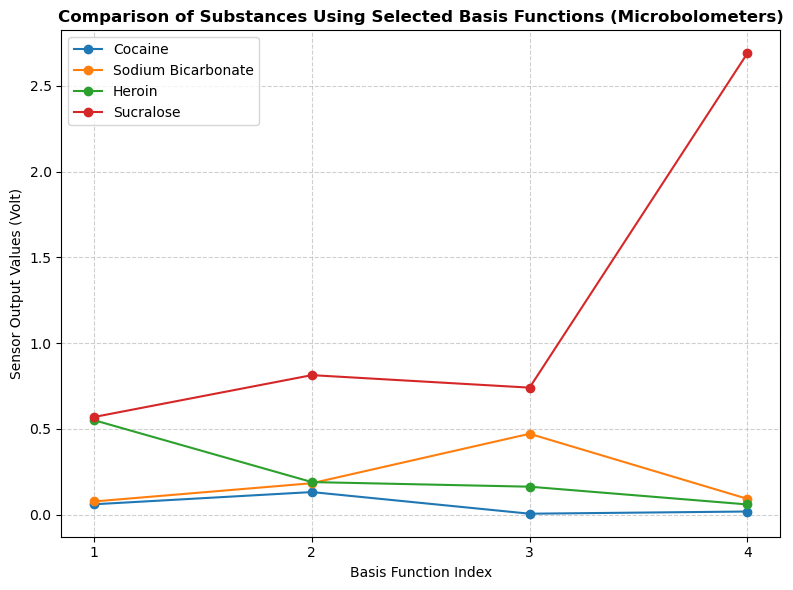

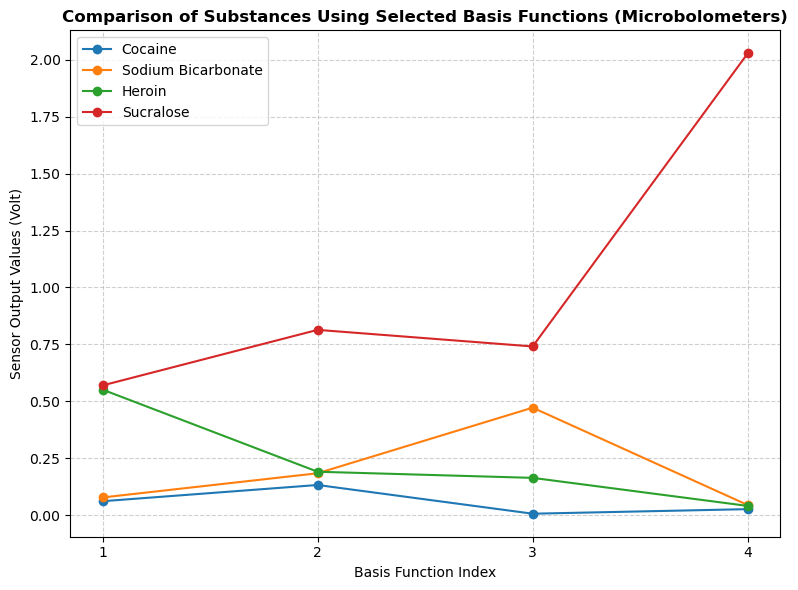

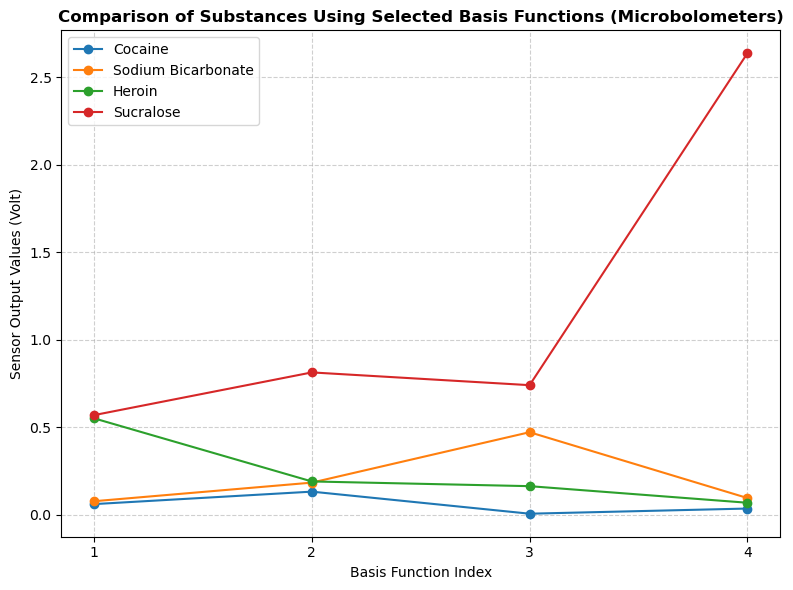

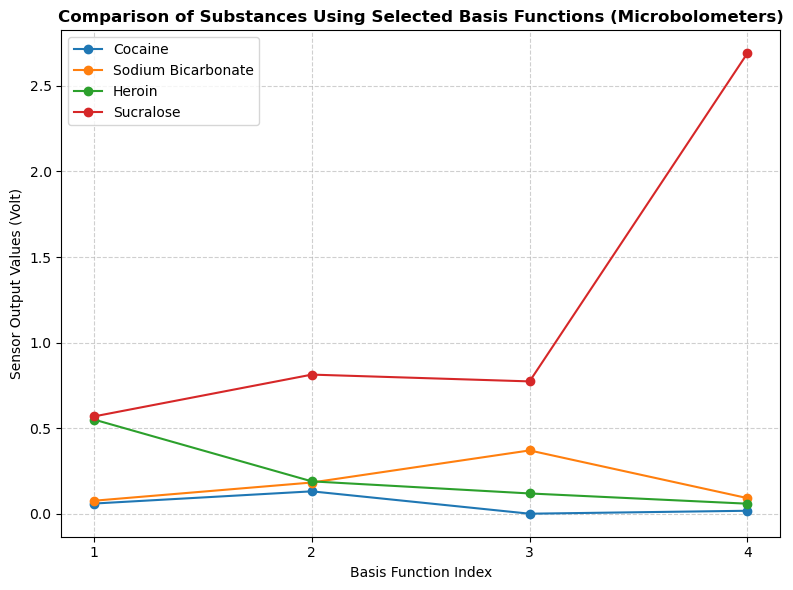

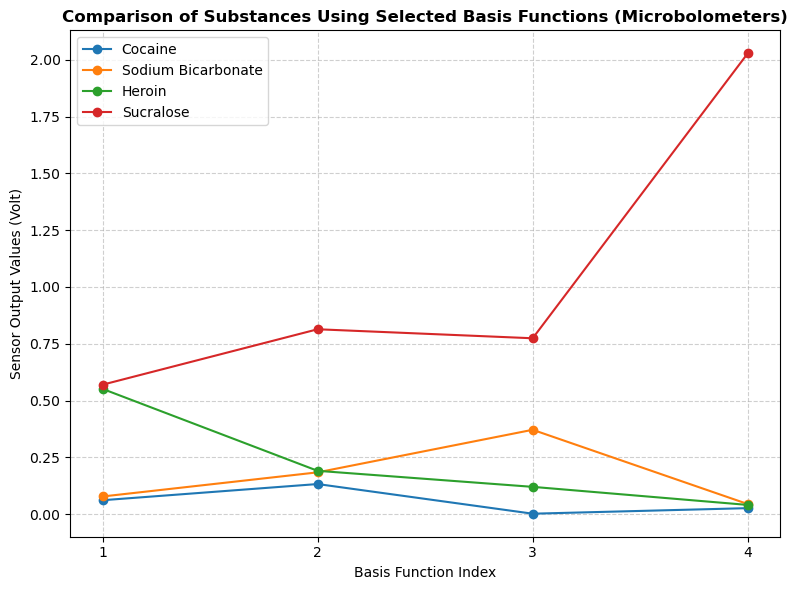

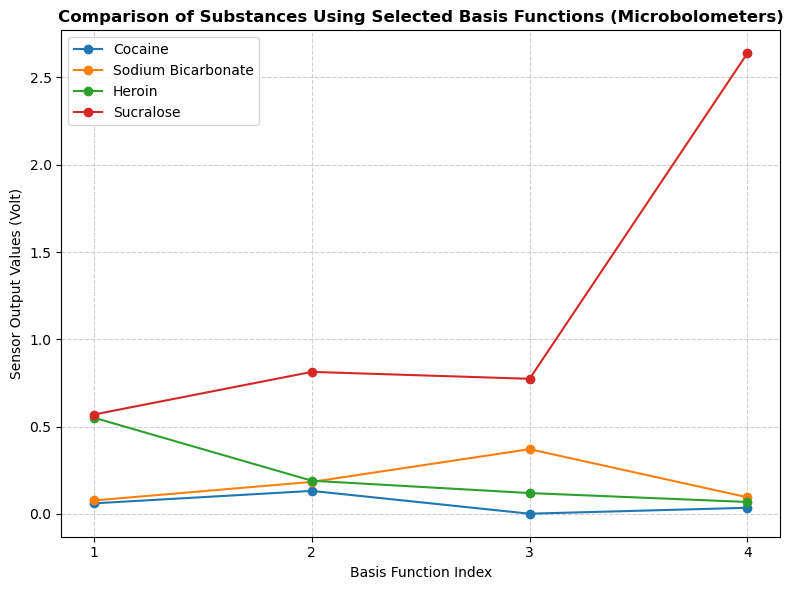

In [14]:
import matplotlib.pyplot as plt
import numpy as np

# Sort results by score in descending order
top_results = results_df.sort_values(by="mean_min_score", ascending=False).head(6)

# Loop through the first 6 best subsets
for idx, row in top_results.iterrows():
    subset_indices = list(row["subset"])  # Get the indices of the current subset
    selected_basis_funcs = gaussian_basis_functions[:, subset_indices]  # Retrieve the basis functions

    # Generate the A matrix using the selected basis functions
    sensor_outputs = simulate_sensor_output(
        wavelengths=wavelengths,
        substances_emissivity=emissivity_curves,
        basis_functions=selected_basis_funcs,
        temperature_K=temperature_K,
        atmospheric_distance_ratio=atmospheric_distance_ratio,
        air_refractive_index=air_refractive_index,
        air_transmittance=air_transmittance
    )

    visualize_sensor_output(sensor_outputs, substance_names)

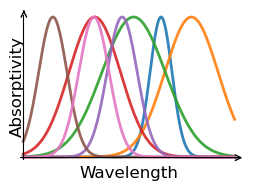

In [15]:
import numpy as np
import matplotlib.pyplot as plt

# Generate x values (from 4 to 20)
x = np.linspace(4, 20, 1000)

# # Randomly generate means and sigmas for the Gaussian curves
# # Generate and log a random seed
# seed = np.random.randint(0, 10000)
# print(f"Random Seed Used: {seed}")
# # Set the seed
# np.random.seed(seed)

np.random.seed(6905)

means = np.random.uniform(6, 18, size=7)  # Random means between 6 and 18
sigmas = np.random.uniform(0.5, 3.0, size=7)  # Larger variance for sigmas (0.5 to 3.0)

# Generate Gaussian-like basis functions
gaussian_basis_functions_demo = [np.exp(-((x - mu)**2) / (2 * sigma**2)) for mu, sigma in zip(means, sigmas)]

# Create a color scheme from Matplotlib's 'tab10' for distinct colors
colors = plt.cm.tab10.colors  # 10 distinct, vibrant colors

# Plot all basis functions
plt.figure(figsize=(3, 2))
for i, bf in enumerate(gaussian_basis_functions_demo):
    plt.plot(x, bf, color=colors[i % len(colors)], linewidth=2, alpha=0.9)  # Cycle through tab10 colors

# Add traditional x and y axes with arrows
plt.axhline(0, color='black', linewidth=0.8, xmin=0.03, xmax=0.97)  # x-axis
plt.axvline(4, color='black', linewidth=0.8, ymin=0.03, ymax=0.97)  # y-axis

# Add arrowheads for axes
plt.annotate('', xy=(20.8, -0.005), xytext=(19.8, -0.005), arrowprops=dict(arrowstyle="->", color='black'))
plt.annotate('', xy=(4.05, 1.05), xytext=(4.05, 1.02), arrowprops=dict(arrowstyle="->", color='black'))

# Add centered axis labels
plt.text(12, -0.15, 'Wavelength', fontsize=12, ha='center')  # Centered along the x-axis
plt.text(3, 0.5, 'Absorptivity', fontsize=12, va='center', rotation='vertical')  # Centered along the y-axis

# Remove top and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)

# Remove ticks
plt.xticks([])  # No tick marks for x-axis
plt.yticks([])  # No tick marks for y-axis

# Add a title
# plt.title("Arbitrary Basis Functions", fontsize=16)

# Save the plot as an image
# plt.savefig("arbitrary_basis_function_generator_high_variance.png", dpi=300, bbox_inches='tight')
plt.show()

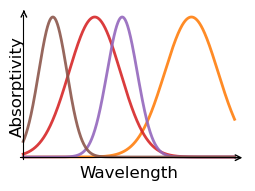

In [16]:
import numpy as np
import matplotlib.pyplot as plt

# Set seed for reproducibility
seed = 6905
np.random.seed(seed)

# Generate x values (from 4 to 20)
x = np.linspace(4, 20, 1000)

# Generate means and sigmas for the 7 basis functions
means = np.random.uniform(6, 18, size=7)  # Random means between 6 and 18
sigmas = np.random.uniform(0.5, 3.0, size=7)  # Larger variance for sigmas (0.5 to 3.0)

# Generate Gaussian-like basis functions
gaussian_basis_functions_demo = [np.exp(-((x - mu)**2) / (2 * sigma**2)) for mu, sigma in zip(means, sigmas)]

# Select a subset of 4 basis functions
selected_indices = [1, 3, 4, 5]  # Customize indices for the subset

# Create a color scheme for all 7 basis functions
colors = plt.cm.tab10.colors  # Vibrant colors from 'tab10'

# Plot the selected subset of basis functions, using the same colors
plt.figure(figsize=(3, 2))
for i in selected_indices:
    plt.plot(x, gaussian_basis_functions_demo[i], color=colors[i % len(colors)], linewidth=2, alpha=0.9)  # Use the same color for each index

# Add traditional x and y axes with arrows
plt.axhline(0, color='black', linewidth=0.8, xmin=0.03, xmax=0.97)  # x-axis
plt.axvline(4, color='black', linewidth=0.8, ymin=0.03, ymax=0.97)  # y-axis

# Add arrowheads for axes
plt.annotate('', xy=(20.8, -0.005), xytext=(19.8, -0.005), arrowprops=dict(arrowstyle="->", color='black'))
plt.annotate('', xy=(4.05, 1.05), xytext=(4.05, 1.02), arrowprops=dict(arrowstyle="->", color='black'))

# Add centered axis labels
plt.text(12, -0.15, 'Wavelength', fontsize=12, ha='center')  # Centered along the x-axis
plt.text(3, 0.5, 'Absorptivity', fontsize=12, va='center', rotation='vertical')  # Centered along the y-axis

# Remove top and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)

# Remove ticks
plt.xticks([])  # No tick marks for x-axis
plt.yticks([])  # No tick marks for y-axis

# Add a title
# plt.title("Subset of 4 Basis Functions", fontsize=16)

# Save the plot as an image
# plt.savefig("subset_of_basis_functions_same_colors.png", dpi=300, bbox_inches='tight')
plt.show()

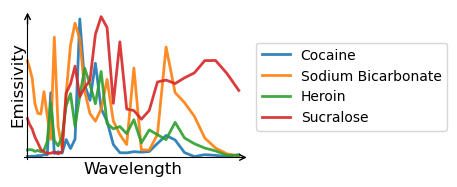

In [17]:
import numpy as np
import matplotlib.pyplot as plt

# Ensure spectra is converted to a NumPy array
spectra_array = wavelengths.to_numpy().flatten()  # Flatten to 1D array for plotting

# Subsample the data (e.g., every 2nd point)
spectra_array = spectra_array[::4]  # Subsample spectra
substances_emissivity_subsampled = emissivity_curves[::4, :]  # Subsample emissivity data

# Create a color scheme for all substances
colors = plt.cm.tab10.colors  # Vibrant colors from 'tab10'

# Plot substances emissivity spectra in "illustration" style
plt.figure(figsize=(3, 2))

# Plot each substance emissivity curve
for i in range(len(substance_names)):
    plt.plot(
        spectra_array, 
        substances_emissivity_subsampled[:, i], 
        color=colors[i % len(colors)], 
        linewidth=2, 
        alpha=0.9, 
        label=substance_names[i]  # Add substance names to the legend
    )

# Add traditional x and y axes with arrows
plt.axhline(0, color='black', linewidth=0.8, xmin=0.03, xmax=0.97)  # x-axis
plt.axvline(spectra_array.min(), color='black', linewidth=0.8, ymin=0.03, ymax=0.97)  # y-axis

# Add arrowheads for axes
plt.annotate('', xy=(spectra_array.max()+0.8, -0.005), xytext=(spectra_array.max(), -0.005), arrowprops=dict(arrowstyle="->", color='black'))
plt.annotate('', xy=(spectra_array.min()+0.01, 1.02), xytext=(spectra_array.min()+0.01, 0.9), arrowprops=dict(arrowstyle="->", color='black'))

# Add centered axis labels
plt.text(spectra_array.mean()+2, -0.12, 'Wavelength', fontsize=12, ha='center')  # Centered along the x-axis
plt.text(spectra_array.min() - 1.3, 0.5, 'Emissivity', fontsize=12, va='center', rotation='vertical')  # Centered along the y-axis

# Remove top and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)

# Remove ticks
plt.xticks([])  # No tick marks for x-axis
plt.yticks([])  # No tick marks for y-axis

# Add a title
# plt.title("Substances Emissivity Spectra", fontsize=16)

# Add a legend on the right side
plt.legend(
    loc='center left', 
    bbox_to_anchor=(1, 0.5), 
    fontsize=10
)

# Save the plot as an image
# plt.savefig("substances_emissivity_spectra_with_legend.png", dpi=300, bbox_inches='tight')
plt.show()

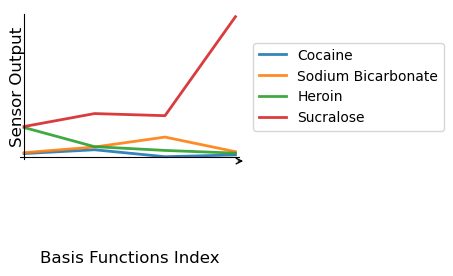

In [18]:
import numpy as np
import matplotlib.pyplot as plt

# Ensure A_matrix is converted to a NumPy array
sensor_outputs = np.array(sensor_outputs)  # Ensure it's a NumPy array if not already

# Create a color scheme for all substances
colors = plt.cm.tab10.colors  # Vibrant colors from 'tab10'

# Plot sensor output in "illustration" style
plt.figure(figsize=(3, 2))

# Plot each substance's sensor output curve
for i in range(sensor_outputs.shape[1]):  # Iterate over substances (columns of A_matrix)
    plt.plot(
        range(1, sensor_outputs.shape[0] + 1),  # Basis function indices (x-axis)
        sensor_outputs[:, i],  # Sensor output values (y-axis)
        color=colors[i % len(colors)], 
        linewidth=2, 
        alpha=0.9, 
        label=substance_names[i]  # Add substance names to the legend
    )

# Add traditional x and y axes with arrows
plt.axhline(0, color='black', linewidth=0.8, xmin=0.03, xmax=0.97)  # x-axis
plt.axvline(1, color='black', linewidth=0.8, ymin=0.03, ymax=0.97)  # y-axis

# Add arrowheads for axes
plt.annotate('', xy=(sensor_outputs.shape[0] + 0.15, -0.08), xytext=(sensor_outputs.shape[0], -0.08), arrowprops=dict(arrowstyle="->", color='black'))
plt.annotate('', xy=(1.01, sensor_outputs.max() + 0.5), xytext=(1.01, sensor_outputs.max() + 0.25), arrowprops=dict(arrowstyle="->", color='black'))

# Add centered axis labels
plt.text(sensor_outputs.shape[0] / 2 + 0.5, -2, 'Basis Functions Index', fontsize=12, ha='center')  # Centered along the x-axis
plt.text(0.8, sensor_outputs.max() / 2, 'Sensor Output', fontsize=12, va='center', rotation='vertical')  # Centered along the y-axis

# Remove top and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)

# Remove ticks
plt.xticks([])  # No tick marks for x-axis
plt.yticks([])  # No tick marks for y-axis

# Add a title
# plt.title("Sensor Outputs for Substances", fontsize=16)

# Add a legend on the right side
plt.legend(
    loc='center left', 
    bbox_to_anchor=(1, 0.5), 
    fontsize=10
)

# Save the plot as an image
# plt.savefig("sensor_outputs_substances_illustration.png", dpi=300, bbox_inches='tight')
plt.show()

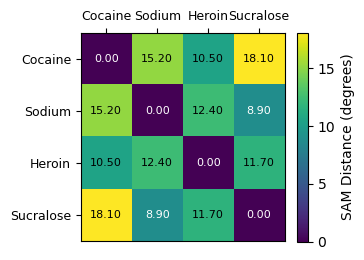

In [19]:
import numpy as np
import matplotlib.pyplot as plt

# Format labels to break into multiple lines if they have more than one word
substance_names = ["Cocaine", "Sodium", "Heroin", "Sucralose"]
labels = ["\n".join(label.split()) for label in substance_names]  # Split by spaces and rejoin with newlines

# Example distance matrix (4x4 for simplicity)
distance_matrix = np.array([
    [0.0, 15.2, 10.5, 18.1],
    [15.2, 0.0, 12.4, 8.9],
    [10.5, 12.4, 0.0, 11.7],
    [18.1, 8.9, 11.7, 0.0]
])

# Set the figure size
plt.figure(figsize=(3.7, 2.7))
ax = plt.gca()  # Get current axis
img = plt.imshow(distance_matrix, cmap="viridis", aspect='auto')

# Add a colorbar
cbar = plt.colorbar(img)
cbar.set_label("SAM Distance (degrees)", fontsize=10)

# Add labels
ax.set_xticks(np.arange(len(labels)))
ax.set_xticklabels(labels, fontsize=9)
ax.set_yticks(np.arange(len(labels)))
ax.set_yticklabels(labels, fontsize=9)

# Move x-axis labels to the top
ax.xaxis.set_label_position('top')
ax.xaxis.tick_top()

# Add cell values (distances)
for i in range(distance_matrix.shape[0]):
    for j in range(distance_matrix.shape[1]):
        plt.text(
            j, i, f"{distance_matrix[i, j]:.2f}",
            ha='center', va='center',
            fontsize=8, color="black" if distance_matrix[i, j] > (distance_matrix.max() / 2) else "white"
        )

# Set title
# plt.title("Distance Matrix (SAM)", fontsize=12, pad=10)

plt.tight_layout()
plt.show()

In [20]:
# # Sample 1/3 of the data for plotting
# results_df_sampled = results_df_sorted.iloc[::3]  # Select every third row

# # Create a smaller illustrative bar plot
# plt.figure(figsize=(3.2, 3))  # Adjust the figure size for a smaller plot
# plt.bar(range(len(results_df_sampled)), results_df_sampled["score"], color='skyblue')
# plt.xlabel("Ranked Basis Function Conbinations", fontsize=10)
# plt.ylabel("SAM Based Score", fontsize=10)
# # plt.title("Ranked Differentiability Scores for Sensor Configurations", fontsize=12)
# plt.xticks(
#     ticks=range(len(results_df_sampled)),
#     labels=[str(sub) for sub in results_df_sampled["subset"]],
#     rotation=90,
#     fontsize=10
# )
# plt.tight_layout()
# plt.show()